# Part 4: Time Evolution of a Wave Packet

## The Time-Dependent Schrödinger Equation

So far we've solved the **time-independent** equation. Now we animate quantum dynamics!

$$i\hbar\frac{\partial\psi}{\partial t} = \hat{H}\psi$$

### Solution via Eigenstate Expansion

If $\psi(x,0)$ is the initial state and $\{\phi_n\}$ are energy eigenstates:

1. **Expand**: $\psi(x,0) = \sum_n c_n \phi_n(x)$ where $c_n = \langle\phi_n|\psi(0)\rangle$

2. **Evolve**: $\psi(x,t) = \sum_n c_n e^{-iE_n t/\hbar} \phi_n(x)$

Each eigenstate gets a **phase factor** $e^{-iE_n t/\hbar}$ that oscillates faster for higher energies.

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import linalg
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams['font.family'] = 'DejaVu Sans'

HBAR = 1.0
M = 1.0

In [2]:
# Core functions
def create_grid(x_min, x_max, N):
    x = np.linspace(x_min, x_max, N)
    return x, x[1] - x[0]

def build_kinetic(N, dx):
    coeff = -HBAR**2 / (2 * M * dx**2)
    return coeff * (np.diag(-2*np.ones(N)) + np.diag(np.ones(N-1), 1) + np.diag(np.ones(N-1), -1))

def harmonic_potential(x, omega=1.0):
    return 0.5 * M * omega**2 * x**2

def solve_schrodinger(T, V, n_states):
    H = T + np.diag(V)
    evals, evecs = linalg.eigh(H)
    return evals[:n_states], evecs[:, :n_states]

## The Gaussian Wave Packet

A Gaussian wave packet is the "most classical" quantum state:

$$\psi(x,0) = \left(\frac{1}{2\pi\sigma^2}\right)^{1/4} e^{-(x-x_0)^2/(4\sigma^2)} e^{ik_0 x}$$

- $x_0$: Initial position (center of packet)
- $\sigma$: Width (uncertainty in position)
- $k_0$: Initial momentum (average velocity)

In [4]:
def gaussian_wave_packet(x, x0, sigma, k0=0):
    """
    Create a Gaussian wave packet.
    
    Parameters:
    -----------
    x : ndarray - Position grid
    x0 : float - Center of packet  
    sigma : float - Width (Heisenberg: Δx ≈ σ)
    k0 : float - Initial momentum (Δp ≈ ℏ/2σ)
    
    Returns:
    --------
    psi : complex ndarray - Initial wavefunction
    """
    norm = (2 * np.pi * sigma**2)**(-0.25)
    gaussian = np.exp(-(x - x0)**2 / (4 * sigma**2))
    momentum = np.exp(1j * k0 * x)  # Complex phase for momentum
    return norm * gaussian * momentum


def time_evolve(psi0, eigenstates, eigenvalues, t):
    """
    Evolve wavefunction from t=0 to time t.
    
    Uses: ψ(t) = Σ cₙ exp(-iEₙt/ℏ) φₙ
    """
    # Expansion coefficients cₙ = ⟨φₙ|ψ(0)⟩
    coeffs = eigenstates.T @ psi0
    
    # Phase factors exp(-iEₙt/ℏ)
    phases = np.exp(-1j * eigenvalues * t / HBAR)
    
    # Reconstruct wavefunction
    return eigenstates @ (coeffs * phases)

In [5]:
# Set up harmonic oscillator
omega = 1.0
N = 500
x, dx = create_grid(-15, 15, N)
T = build_kinetic(N, dx)
V = harmonic_potential(x, omega)

# Get eigenstates (need many for accurate expansion)
n_eigen = 100
energies, eigenstates = solve_schrodinger(T, V, n_eigen)

# Normalize eigenstates
for i in range(n_eigen):
    norm = np.sqrt(np.trapezoid(np.abs(eigenstates[:, i])**2, dx=dx))
    eigenstates[:, i] /= norm

print(f"Computed {n_eigen} eigenstates for expansion")

Computed 100 eigenstates for expansion


In [7]:
# Create initial wave packet
x0 = 3.0      # Displaced from center
sigma = 0.5   # Narrow packet
k0 = 0.0      # Released from rest

psi0 = gaussian_wave_packet(x, x0, sigma, k0)
psi0 /= np.sqrt(np.trapezoid(np.abs(psi0)**2, dx=dx))  # Normalize

# Check expansion completeness
coeffs = dx * eigenstates.T @ psi0
print(f"Sum |cₙ|² = {np.sum(np.abs(coeffs)**2):.4f} (should be ≈ 1)")

Sum |cₙ|² = 1.0000 (should be ≈ 1)


## Expectation Values: The Ehrenfest Theorem

The **Ehrenfest theorem** states that quantum expectation values follow classical equations:

$$\frac{d\langle x\rangle}{dt} = \frac{\langle p\rangle}{m}$$
$$\frac{d\langle p\rangle}{dt} = -\langle\nabla V\rangle$$

For harmonic oscillator: $\langle x(t)\rangle = x_0\cos(\omega t)$

In [8]:
def compute_expectation_x(psi, x, dx):
    """⟨x⟩ = ∫ x|ψ|² dx"""
    return np.trapezoid(x * np.abs(psi)**2, dx=dx)

def compute_expectation_p(psi, x, dx):
    """⟨p⟩ = -iℏ ∫ ψ* (dψ/dx) dx"""
    dpsi = np.gradient(psi, dx)
    return (-1j * HBAR * np.trapezoid(np.conj(psi) * dpsi, dx=dx)).real

In [9]:
# Compute ⟨x⟩ and ⟨p⟩ over time
T_period = 2 * np.pi / omega
t_values = np.linspace(0, 2 * T_period, 200)

x_expect, p_expect = [], []
for t in t_values:
    psi_t = time_evolve(psi0, eigenstates, energies, t)
    x_expect.append(compute_expectation_x(psi_t, x, dx))
    p_expect.append(compute_expectation_p(psi_t, x, dx))

x_expect = np.array(x_expect)
p_expect = np.array(p_expect)

# Classical solution
x_classical = x0 * np.cos(omega * t_values)
p_classical = -M * omega * x0 * np.sin(omega * t_values)

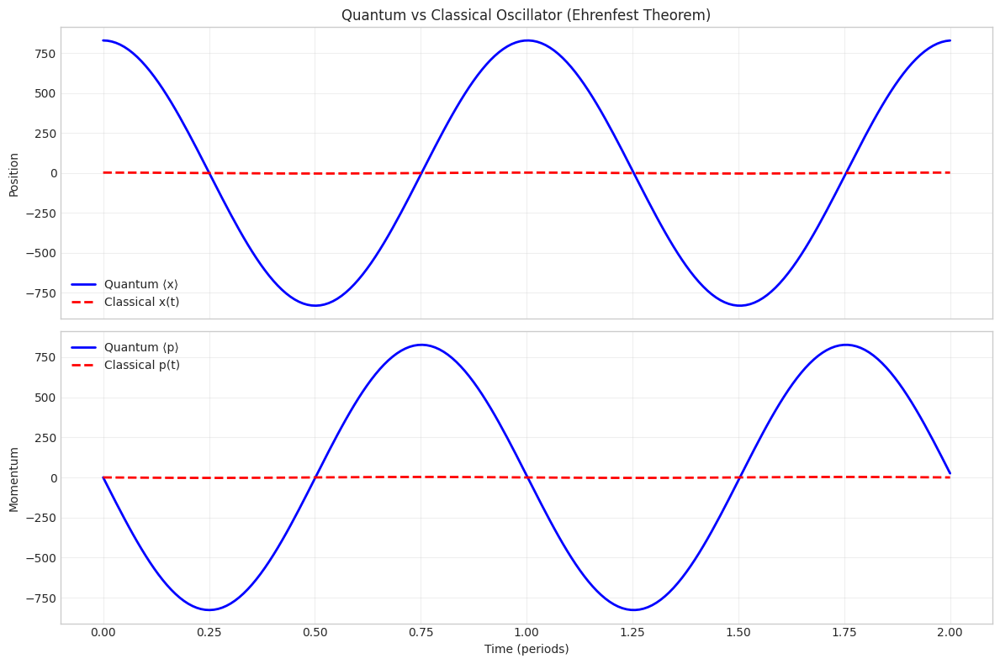

In [12]:
# Plot comparison
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

ax1.plot(t_values/T_period, x_expect, 'b-', lw=2, label='Quantum ⟨x⟩')
ax1.plot(t_values/T_period, x_classical, 'r--', lw=2, label='Classical x(t)')
ax1.set_ylabel('Position')
ax1.set_title('Quantum vs Classical Oscillator (Ehrenfest Theorem)')
ax1.legend()
ax1.grid(True, alpha=0.3)

ax2.plot(t_values/T_period, p_expect, 'b-', lw=2, label='Quantum ⟨p⟩')
ax2.plot(t_values/T_period, p_classical, 'r--', lw=2, label='Classical p(t)')
ax2.set_xlabel('Time (periods)')
ax2.set_ylabel('Momentum')
ax2.legend()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('quantum_vs_classical.png', dpi=150)
plt.show()

In [16]:
# ============================================================
# ANIMATION: Wave Packet Evolution
# ============================================================

fig, ax = plt.subplots(figsize=(10, 6))

# Potential (scaled)
ax.fill_between(x, V/np.max(V)*0.5, alpha=0.2, color='gray')

line, = ax.plot([], [], 'b-', lw=2)
time_text = ax.text(0.02, 0.95, '', transform=ax.transAxes)

ax.set_xlim(-10, 10)
ax.set_ylim(0, 0.6)
ax.set_xlabel('Position x')
ax.set_ylabel(r'$|\psi(x,t)|^2$')
ax.set_title('Wave Packet Oscillation in Harmonic Potential')
ax.grid(True, alpha=0.3)

def init():
    line.set_data([], [])
    time_text.set_text('')
    return line, time_text

def animate(frame):
    t = t_values[frame]
    psi_t = time_evolve(psi0, eigenstates, energies, t)
    prob = np.abs(psi_t)**2
    line.set_data(x, prob)
    time_text.set_text(f't = {t:.2f} ({t/T_period:.2f} periods)')
    return line, time_text

anim = FuncAnimation(fig, animate, init_func=init, 
                     frames=len(t_values), interval=50, blit=True)

plt.close()
HTML(anim.to_jshtml())

## Key Observations

1. **Oscillation**: The wave packet moves back and forth like a classical particle
2. **Ehrenfest**: ⟨x⟩ and ⟨p⟩ follow classical equations exactly
3. **Shape preservation**: In harmonic potential, Gaussian packets don't spread!
4. **Quantum features**: Unlike classical particle, we see probability distribution